Training with the RGB channel

In [1]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion()   # interactive mode

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.insert(0, '../')

In [4]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0,1'

# Training using the ResNet topology

In [5]:
from cpe775.networks.resnet import resnet18

In [6]:
net = resnet18(in_shape=(-1, 3, 256, 256), out_shape=(-1, 68, 2))

## Loading the dataset and splitting between train and valid

In [7]:
from cpe775.dataset import FaceLandmarksDataset, CroppedFaceLandmarksDataset
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision.transforms import Compose
from cpe775.transforms import ToTensor, CropFace, ToGray, RandomHorizontalFlip, ToPILImage, RandomCrop, CenterCrop

In [8]:
batch_size = 128
random_seed = 42
valid_size = 0.2
shuffle = True

In [9]:
train_transforms = Compose([
                   ToPILImage(),
                   RandomCrop((224,224)),
                   RandomHorizontalFlip(),
                   ToTensor()
                 ])

transforms = Compose([
                   ToPILImage(),
                   CenterCrop((224,224)),
                   ToTensor()
                 ])

In [10]:
# load the dataset
train_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=train_transforms)
valid_dataset = CroppedFaceLandmarksDataset(data_file='../data/train.npz',
                                            transform=transforms)

num_train = len(train_dataset)
indices = list(range(num_train))
split = int(np.floor(valid_size * num_train))

if shuffle == True:
    np.random.seed(random_seed)
    np.random.shuffle(indices)

train_idx, valid_idx = indices[split:], indices[:split]

train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

train_loader = torch.utils.data.DataLoader(train_dataset, 
                batch_size=batch_size, sampler=train_sampler, num_workers=4)

valid_loader = torch.utils.data.DataLoader(valid_dataset, 
                batch_size=batch_size, sampler=valid_sampler, num_workers=4)

## Creating the model

In [11]:
net = torch.nn.DataParallel(net)
net = net.cuda()

In [12]:
np.sum([v.numel() for v in net.parameters()])

719640

## Creating the loss function

In [13]:
import torch
from cpe775.criterion import NRMSELoss
from cpe775.model import Model
from cpe775 import callbacks

In [14]:
criterion = NRMSELoss()
criterion = criterion.cuda()

In [15]:
optimizer = torch.optim.SGD(net.parameters(), 0.1, momentum=0.9)
model = Model(net, criterion=criterion)
model.set_optimizer(optimizer)

## Training

In [16]:
from torch.optim.lr_scheduler import MultiStepLR
from cpe775 import metrics

In [17]:
callback_list = [
        callbacks.Progbar(print_freq=40),
        callbacks.ModelCheckpoint('../results/resnet/resnet-18-3c-nrmse.pth.tar', 'val_loss', mode='min'),
        callbacks.LearningRateScheduler(MultiStepLR(optimizer, milestones=[750,950], gamma=0.1))
    ]

In [18]:
model.fit_loader(train_loader, 1000, val_loader=valid_loader,
                 callback=callbacks.Compose(callback_list), metrics={'nrmse': NRMSELoss(weight=68)})

Epoch: [0][0/20]	Time 6.452 (6.452)	Data 0.354 (0.354)	Train Loss 3.355 (3.355)	Train Nrmse 228.163 (228.163)	
Val: [0/5]	Time 0.482 (0.482)	Data 0.445 (0.445)	Val Loss 69.157 (69.157)	Val Nrmse 4702.666 (4702.666)	
Epoch: [1][0/20]	Time 0.522 (0.522)	Data 0.461 (0.461)	Train Loss 0.610 (0.610)	Train Nrmse 41.483 (41.483)	
Val: [0/5]	Time 0.439 (0.439)	Data 0.403 (0.403)	Val Loss 0.838 (0.838)	Val Nrmse 57.005 (57.005)	
Epoch: [2][0/20]	Time 0.521 (0.521)	Data 0.466 (0.466)	Train Loss 0.395 (0.395)	Train Nrmse 26.840 (26.840)	
Val: [0/5]	Time 0.436 (0.436)	Data 0.400 (0.400)	Val Loss 0.344 (0.344)	Val Nrmse 23.359 (23.359)	
Epoch: [3][0/20]	Time 0.464 (0.464)	Data 0.409 (0.409)	Train Loss 0.327 (0.327)	Train Nrmse 22.233 (22.233)	
Val: [0/5]	Time 0.487 (0.487)	Data 0.459 (0.459)	Val Loss 0.294 (0.294)	Val Nrmse 19.996 (19.996)	
Epoch: [4][0/20]	Time 0.462 (0.462)	Data 0.408 (0.408)	Train Loss 0.313 (0.313)	Train Nrmse 21.268 (21.268)	
Val: [0/5]	Time 0.455 (0.455)	Data 0.419 (0.419)	Va

Val: [0/5]	Time 0.465 (0.465)	Data 0.435 (0.435)	Val Loss 0.147 (0.147)	Val Nrmse 10.014 (10.014)	
Epoch: [40][0/20]	Time 0.494 (0.494)	Data 0.447 (0.447)	Train Loss 0.138 (0.138)	Train Nrmse 9.395 (9.395)	
Val: [0/5]	Time 0.502 (0.502)	Data 0.466 (0.466)	Val Loss 0.138 (0.138)	Val Nrmse 9.412 (9.412)	
Epoch: [41][0/20]	Time 0.467 (0.467)	Data 0.416 (0.416)	Train Loss 0.142 (0.142)	Train Nrmse 9.679 (9.679)	
Val: [0/5]	Time 0.478 (0.478)	Data 0.443 (0.443)	Val Loss 0.120 (0.120)	Val Nrmse 8.188 (8.188)	
Epoch: [42][0/20]	Time 0.471 (0.471)	Data 0.416 (0.416)	Train Loss 0.129 (0.129)	Train Nrmse 8.753 (8.753)	
Val: [0/5]	Time 0.488 (0.488)	Data 0.458 (0.458)	Val Loss 0.131 (0.131)	Val Nrmse 8.893 (8.893)	
Epoch: [43][0/20]	Time 0.463 (0.463)	Data 0.414 (0.414)	Train Loss 0.140 (0.140)	Train Nrmse 9.553 (9.553)	
Val: [0/5]	Time 0.470 (0.470)	Data 0.436 (0.436)	Val Loss 0.140 (0.140)	Val Nrmse 9.553 (9.553)	
Epoch: [44][0/20]	Time 0.451 (0.451)	Data 0.398 (0.398)	Train Loss 0.122 (0.122)	

Val: [0/5]	Time 0.506 (0.506)	Data 0.478 (0.478)	Val Loss 0.106 (0.106)	Val Nrmse 7.179 (7.179)	
Epoch: [80][0/20]	Time 0.453 (0.453)	Data 0.406 (0.406)	Train Loss 0.092 (0.092)	Train Nrmse 6.258 (6.258)	
Val: [0/5]	Time 0.481 (0.481)	Data 0.453 (0.453)	Val Loss 0.095 (0.095)	Val Nrmse 6.434 (6.434)	
Epoch: [81][0/20]	Time 0.489 (0.489)	Data 0.442 (0.442)	Train Loss 0.095 (0.095)	Train Nrmse 6.488 (6.488)	
Val: [0/5]	Time 0.447 (0.447)	Data 0.416 (0.416)	Val Loss 0.101 (0.101)	Val Nrmse 6.875 (6.875)	
Epoch: [82][0/20]	Time 0.475 (0.475)	Data 0.422 (0.422)	Train Loss 0.094 (0.094)	Train Nrmse 6.399 (6.399)	
Val: [0/5]	Time 0.503 (0.503)	Data 0.475 (0.475)	Val Loss 0.092 (0.092)	Val Nrmse 6.259 (6.259)	
Epoch: [83][0/20]	Time 0.504 (0.504)	Data 0.445 (0.445)	Train Loss 0.096 (0.096)	Train Nrmse 6.503 (6.503)	
Val: [0/5]	Time 0.463 (0.463)	Data 0.434 (0.434)	Val Loss 0.085 (0.085)	Val Nrmse 5.759 (5.759)	
Epoch: [84][0/20]	Time 0.455 (0.455)	Data 0.409 (0.409)	Train Loss 0.090 (0.090)	Tr

Val: [0/5]	Time 0.472 (0.472)	Data 0.444 (0.444)	Val Loss 0.082 (0.082)	Val Nrmse 5.578 (5.578)	
Epoch: [120][0/20]	Time 0.485 (0.485)	Data 0.444 (0.444)	Train Loss 0.082 (0.082)	Train Nrmse 5.586 (5.586)	
Val: [0/5]	Time 0.478 (0.478)	Data 0.442 (0.442)	Val Loss 0.092 (0.092)	Val Nrmse 6.249 (6.249)	
Epoch: [121][0/20]	Time 0.512 (0.512)	Data 0.468 (0.468)	Train Loss 0.080 (0.080)	Train Nrmse 5.464 (5.464)	
Val: [0/5]	Time 0.482 (0.482)	Data 0.453 (0.453)	Val Loss 0.087 (0.087)	Val Nrmse 5.924 (5.924)	
Epoch: [122][0/20]	Time 0.464 (0.464)	Data 0.417 (0.417)	Train Loss 0.083 (0.083)	Train Nrmse 5.623 (5.623)	
Val: [0/5]	Time 0.469 (0.469)	Data 0.430 (0.430)	Val Loss 0.088 (0.088)	Val Nrmse 5.991 (5.991)	
Epoch: [123][0/20]	Time 0.488 (0.488)	Data 0.439 (0.439)	Train Loss 0.086 (0.086)	Train Nrmse 5.848 (5.848)	
Val: [0/5]	Time 0.489 (0.489)	Data 0.453 (0.453)	Val Loss 0.087 (0.087)	Val Nrmse 5.910 (5.910)	
Epoch: [124][0/20]	Time 0.463 (0.463)	Data 0.407 (0.407)	Train Loss 0.085 (0.08

Val: [0/5]	Time 0.482 (0.482)	Data 0.453 (0.453)	Val Loss 0.073 (0.073)	Val Nrmse 4.933 (4.933)	
Epoch: [160][0/20]	Time 0.465 (0.465)	Data 0.420 (0.420)	Train Loss 0.074 (0.074)	Train Nrmse 5.063 (5.063)	
Val: [0/5]	Time 0.455 (0.455)	Data 0.416 (0.416)	Val Loss 0.075 (0.075)	Val Nrmse 5.131 (5.131)	
Epoch: [161][0/20]	Time 0.491 (0.491)	Data 0.446 (0.446)	Train Loss 0.073 (0.073)	Train Nrmse 4.979 (4.979)	
Val: [0/5]	Time 0.445 (0.445)	Data 0.414 (0.414)	Val Loss 0.082 (0.082)	Val Nrmse 5.555 (5.555)	
Epoch: [162][0/20]	Time 0.515 (0.515)	Data 0.459 (0.459)	Train Loss 0.088 (0.088)	Train Nrmse 5.960 (5.960)	
Val: [0/5]	Time 0.487 (0.487)	Data 0.458 (0.458)	Val Loss 0.076 (0.076)	Val Nrmse 5.200 (5.200)	
Epoch: [163][0/20]	Time 0.460 (0.460)	Data 0.402 (0.402)	Train Loss 0.073 (0.073)	Train Nrmse 4.943 (4.943)	
Val: [0/5]	Time 0.467 (0.467)	Data 0.435 (0.435)	Val Loss 0.081 (0.081)	Val Nrmse 5.518 (5.518)	
Epoch: [164][0/20]	Time 0.453 (0.453)	Data 0.404 (0.404)	Train Loss 0.075 (0.07

Val: [0/5]	Time 0.488 (0.488)	Data 0.457 (0.457)	Val Loss 0.077 (0.077)	Val Nrmse 5.213 (5.213)	
Epoch: [200][0/20]	Time 0.480 (0.480)	Data 0.428 (0.428)	Train Loss 0.077 (0.077)	Train Nrmse 5.236 (5.236)	
Val: [0/5]	Time 0.492 (0.492)	Data 0.465 (0.465)	Val Loss 0.077 (0.077)	Val Nrmse 5.209 (5.209)	
Epoch: [201][0/20]	Time 0.537 (0.537)	Data 0.482 (0.482)	Train Loss 0.083 (0.083)	Train Nrmse 5.612 (5.612)	
Val: [0/5]	Time 0.487 (0.487)	Data 0.460 (0.460)	Val Loss 0.070 (0.070)	Val Nrmse 4.791 (4.791)	
Epoch: [202][0/20]	Time 0.457 (0.457)	Data 0.406 (0.406)	Train Loss 0.070 (0.070)	Train Nrmse 4.740 (4.740)	
Val: [0/5]	Time 0.468 (0.468)	Data 0.429 (0.429)	Val Loss 0.081 (0.081)	Val Nrmse 5.494 (5.494)	
Epoch: [203][0/20]	Time 0.485 (0.485)	Data 0.432 (0.432)	Train Loss 0.071 (0.071)	Train Nrmse 4.800 (4.800)	
Val: [0/5]	Time 0.494 (0.494)	Data 0.465 (0.465)	Val Loss 0.087 (0.087)	Val Nrmse 5.891 (5.891)	
Epoch: [204][0/20]	Time 0.515 (0.515)	Data 0.449 (0.449)	Train Loss 0.073 (0.07

Val: [0/5]	Time 0.466 (0.466)	Data 0.433 (0.433)	Val Loss 0.073 (0.073)	Val Nrmse 4.931 (4.931)	
Epoch: [240][0/20]	Time 0.515 (0.515)	Data 0.464 (0.464)	Train Loss 0.066 (0.066)	Train Nrmse 4.490 (4.490)	
Val: [0/5]	Time 0.453 (0.453)	Data 0.422 (0.422)	Val Loss 0.079 (0.079)	Val Nrmse 5.341 (5.341)	
Epoch: [241][0/20]	Time 0.468 (0.468)	Data 0.427 (0.427)	Train Loss 0.068 (0.068)	Train Nrmse 4.643 (4.643)	
Val: [0/5]	Time 0.470 (0.470)	Data 0.442 (0.442)	Val Loss 0.072 (0.072)	Val Nrmse 4.899 (4.899)	
Epoch: [242][0/20]	Time 0.481 (0.481)	Data 0.428 (0.428)	Train Loss 0.064 (0.064)	Train Nrmse 4.358 (4.358)	
Val: [0/5]	Time 0.436 (0.436)	Data 0.405 (0.405)	Val Loss 0.065 (0.065)	Val Nrmse 4.423 (4.423)	
Epoch: [243][0/20]	Time 0.503 (0.503)	Data 0.451 (0.451)	Train Loss 0.066 (0.066)	Train Nrmse 4.485 (4.485)	
Val: [0/5]	Time 0.450 (0.450)	Data 0.421 (0.421)	Val Loss 0.073 (0.073)	Val Nrmse 4.967 (4.967)	
Epoch: [244][0/20]	Time 0.484 (0.484)	Data 0.429 (0.429)	Train Loss 0.065 (0.06

Val: [0/5]	Time 0.439 (0.439)	Data 0.405 (0.405)	Val Loss 0.070 (0.070)	Val Nrmse 4.747 (4.747)	
Epoch: [280][0/20]	Time 0.482 (0.482)	Data 0.430 (0.430)	Train Loss 0.061 (0.061)	Train Nrmse 4.148 (4.148)	
Val: [0/5]	Time 0.467 (0.467)	Data 0.428 (0.428)	Val Loss 0.067 (0.067)	Val Nrmse 4.531 (4.531)	
Epoch: [281][0/20]	Time 0.458 (0.458)	Data 0.404 (0.404)	Train Loss 0.064 (0.064)	Train Nrmse 4.359 (4.359)	
Val: [0/5]	Time 0.463 (0.463)	Data 0.430 (0.430)	Val Loss 0.069 (0.069)	Val Nrmse 4.659 (4.659)	
Epoch: [282][0/20]	Time 0.499 (0.499)	Data 0.446 (0.446)	Train Loss 0.061 (0.061)	Train Nrmse 4.165 (4.165)	
Val: [0/5]	Time 0.493 (0.493)	Data 0.465 (0.465)	Val Loss 0.070 (0.070)	Val Nrmse 4.773 (4.773)	
Epoch: [283][0/20]	Time 0.524 (0.524)	Data 0.471 (0.471)	Train Loss 0.059 (0.059)	Train Nrmse 4.042 (4.042)	
Val: [0/5]	Time 0.456 (0.456)	Data 0.419 (0.419)	Val Loss 0.065 (0.065)	Val Nrmse 4.389 (4.389)	
Epoch: [284][0/20]	Time 0.504 (0.504)	Data 0.452 (0.452)	Train Loss 0.063 (0.06

Val: [0/5]	Time 0.436 (0.436)	Data 0.405 (0.405)	Val Loss 0.070 (0.070)	Val Nrmse 4.791 (4.791)	
Epoch: [320][0/20]	Time 0.534 (0.534)	Data 0.477 (0.477)	Train Loss 0.066 (0.066)	Train Nrmse 4.476 (4.476)	
Val: [0/5]	Time 0.469 (0.469)	Data 0.441 (0.441)	Val Loss 0.068 (0.068)	Val Nrmse 4.616 (4.616)	
Epoch: [321][0/20]	Time 0.492 (0.492)	Data 0.452 (0.452)	Train Loss 0.062 (0.062)	Train Nrmse 4.183 (4.183)	
Val: [0/5]	Time 0.490 (0.490)	Data 0.462 (0.462)	Val Loss 0.074 (0.074)	Val Nrmse 5.008 (5.008)	
Epoch: [322][0/20]	Time 0.504 (0.504)	Data 0.450 (0.450)	Train Loss 0.065 (0.065)	Train Nrmse 4.392 (4.392)	
Val: [0/5]	Time 0.493 (0.493)	Data 0.458 (0.458)	Val Loss 0.064 (0.064)	Val Nrmse 4.337 (4.337)	
Epoch: [323][0/20]	Time 0.519 (0.519)	Data 0.464 (0.464)	Train Loss 0.061 (0.061)	Train Nrmse 4.134 (4.134)	
Val: [0/5]	Time 0.490 (0.490)	Data 0.461 (0.461)	Val Loss 0.074 (0.074)	Val Nrmse 5.029 (5.029)	
Epoch: [324][0/20]	Time 0.504 (0.504)	Data 0.441 (0.441)	Train Loss 0.067 (0.06

Val: [0/5]	Time 0.484 (0.484)	Data 0.456 (0.456)	Val Loss 0.062 (0.062)	Val Nrmse 4.223 (4.223)	
Epoch: [360][0/20]	Time 0.479 (0.479)	Data 0.421 (0.421)	Train Loss 0.057 (0.057)	Train Nrmse 3.855 (3.855)	
Val: [0/5]	Time 0.430 (0.430)	Data 0.401 (0.401)	Val Loss 0.067 (0.067)	Val Nrmse 4.578 (4.578)	
Epoch: [361][0/20]	Time 0.451 (0.451)	Data 0.399 (0.399)	Train Loss 0.061 (0.061)	Train Nrmse 4.148 (4.148)	
Val: [0/5]	Time 0.459 (0.459)	Data 0.424 (0.424)	Val Loss 0.069 (0.069)	Val Nrmse 4.721 (4.721)	
Epoch: [362][0/20]	Time 0.491 (0.491)	Data 0.442 (0.442)	Train Loss 0.059 (0.059)	Train Nrmse 4.023 (4.023)	
Val: [0/5]	Time 0.457 (0.457)	Data 0.419 (0.419)	Val Loss 0.068 (0.068)	Val Nrmse 4.646 (4.646)	
Epoch: [363][0/20]	Time 0.518 (0.518)	Data 0.466 (0.466)	Train Loss 0.058 (0.058)	Train Nrmse 3.949 (3.949)	
Val: [0/5]	Time 0.446 (0.446)	Data 0.418 (0.418)	Val Loss 0.063 (0.063)	Val Nrmse 4.297 (4.297)	
Epoch: [364][0/20]	Time 0.516 (0.516)	Data 0.463 (0.463)	Train Loss 0.061 (0.06

Val: [0/5]	Time 0.438 (0.438)	Data 0.403 (0.403)	Val Loss 0.062 (0.062)	Val Nrmse 4.191 (4.191)	
Epoch: [400][0/20]	Time 0.461 (0.461)	Data 0.403 (0.403)	Train Loss 0.058 (0.058)	Train Nrmse 3.956 (3.956)	
Val: [0/5]	Time 0.481 (0.481)	Data 0.443 (0.443)	Val Loss 0.067 (0.067)	Val Nrmse 4.531 (4.531)	
Epoch: [401][0/20]	Time 0.455 (0.455)	Data 0.412 (0.412)	Train Loss 0.059 (0.059)	Train Nrmse 4.029 (4.029)	
Val: [0/5]	Time 0.482 (0.482)	Data 0.454 (0.454)	Val Loss 0.072 (0.072)	Val Nrmse 4.927 (4.927)	
Epoch: [402][0/20]	Time 0.516 (0.516)	Data 0.464 (0.464)	Train Loss 0.061 (0.061)	Train Nrmse 4.136 (4.136)	
Val: [0/5]	Time 0.481 (0.481)	Data 0.454 (0.454)	Val Loss 0.061 (0.061)	Val Nrmse 4.120 (4.120)	
Epoch: [403][0/20]	Time 0.502 (0.502)	Data 0.447 (0.447)	Train Loss 0.057 (0.057)	Train Nrmse 3.855 (3.855)	
Val: [0/5]	Time 0.453 (0.453)	Data 0.419 (0.419)	Val Loss 0.062 (0.062)	Val Nrmse 4.241 (4.241)	
Epoch: [404][0/20]	Time 0.455 (0.455)	Data 0.410 (0.410)	Train Loss 0.061 (0.06

Val: [0/5]	Time 0.456 (0.456)	Data 0.428 (0.428)	Val Loss 0.062 (0.062)	Val Nrmse 4.182 (4.182)	
Epoch: [440][0/20]	Time 0.497 (0.497)	Data 0.451 (0.451)	Train Loss 0.057 (0.057)	Train Nrmse 3.876 (3.876)	
Val: [0/5]	Time 0.486 (0.486)	Data 0.452 (0.452)	Val Loss 0.063 (0.063)	Val Nrmse 4.303 (4.303)	
Epoch: [441][0/20]	Time 0.469 (0.469)	Data 0.414 (0.414)	Train Loss 0.056 (0.056)	Train Nrmse 3.801 (3.801)	
Val: [0/5]	Time 0.488 (0.488)	Data 0.460 (0.460)	Val Loss 0.063 (0.063)	Val Nrmse 4.287 (4.287)	
Epoch: [442][0/20]	Time 0.486 (0.486)	Data 0.439 (0.439)	Train Loss 0.058 (0.058)	Train Nrmse 3.914 (3.914)	
Val: [0/5]	Time 0.456 (0.456)	Data 0.418 (0.418)	Val Loss 0.064 (0.064)	Val Nrmse 4.367 (4.367)	
Epoch: [443][0/20]	Time 0.492 (0.492)	Data 0.436 (0.436)	Train Loss 0.060 (0.060)	Train Nrmse 4.067 (4.067)	
Val: [0/5]	Time 0.437 (0.437)	Data 0.398 (0.398)	Val Loss 0.066 (0.066)	Val Nrmse 4.480 (4.480)	
Epoch: [444][0/20]	Time 0.497 (0.497)	Data 0.443 (0.443)	Train Loss 0.058 (0.05

Val: [0/5]	Time 0.485 (0.485)	Data 0.457 (0.457)	Val Loss 0.063 (0.063)	Val Nrmse 4.317 (4.317)	
Epoch: [480][0/20]	Time 0.508 (0.508)	Data 0.457 (0.457)	Train Loss 0.057 (0.057)	Train Nrmse 3.870 (3.870)	
Val: [0/5]	Time 0.461 (0.461)	Data 0.432 (0.432)	Val Loss 0.065 (0.065)	Val Nrmse 4.441 (4.441)	
Epoch: [481][0/20]	Time 0.486 (0.486)	Data 0.441 (0.441)	Train Loss 0.055 (0.055)	Train Nrmse 3.772 (3.772)	
Val: [0/5]	Time 0.468 (0.468)	Data 0.439 (0.439)	Val Loss 0.060 (0.060)	Val Nrmse 4.055 (4.055)	
Epoch: [482][0/20]	Time 0.462 (0.462)	Data 0.418 (0.418)	Train Loss 0.055 (0.055)	Train Nrmse 3.751 (3.751)	
Val: [0/5]	Time 0.433 (0.433)	Data 0.400 (0.400)	Val Loss 0.067 (0.067)	Val Nrmse 4.523 (4.523)	
Epoch: [483][0/20]	Time 0.457 (0.457)	Data 0.408 (0.408)	Train Loss 0.054 (0.054)	Train Nrmse 3.686 (3.686)	
Val: [0/5]	Time 0.483 (0.483)	Data 0.456 (0.456)	Val Loss 0.063 (0.063)	Val Nrmse 4.263 (4.263)	
Epoch: [484][0/20]	Time 0.474 (0.474)	Data 0.422 (0.422)	Train Loss 0.057 (0.05

Val: [0/5]	Time 0.477 (0.477)	Data 0.443 (0.443)	Val Loss 0.066 (0.066)	Val Nrmse 4.501 (4.501)	
Epoch: [520][0/20]	Time 0.455 (0.455)	Data 0.415 (0.415)	Train Loss 0.057 (0.057)	Train Nrmse 3.853 (3.853)	
Val: [0/5]	Time 0.465 (0.465)	Data 0.437 (0.437)	Val Loss 0.063 (0.063)	Val Nrmse 4.302 (4.302)	
Epoch: [521][0/20]	Time 0.455 (0.455)	Data 0.409 (0.409)	Train Loss 0.055 (0.055)	Train Nrmse 3.735 (3.735)	
Val: [0/5]	Time 0.485 (0.485)	Data 0.457 (0.457)	Val Loss 0.064 (0.064)	Val Nrmse 4.354 (4.354)	
Epoch: [522][0/20]	Time 0.470 (0.470)	Data 0.426 (0.426)	Train Loss 0.056 (0.056)	Train Nrmse 3.783 (3.783)	
Val: [0/5]	Time 0.457 (0.457)	Data 0.430 (0.430)	Val Loss 0.064 (0.064)	Val Nrmse 4.319 (4.319)	
Epoch: [523][0/20]	Time 0.466 (0.466)	Data 0.418 (0.418)	Train Loss 0.056 (0.056)	Train Nrmse 3.818 (3.818)	
Val: [0/5]	Time 0.445 (0.445)	Data 0.417 (0.417)	Val Loss 0.064 (0.064)	Val Nrmse 4.322 (4.322)	
Epoch: [524][0/20]	Time 0.453 (0.453)	Data 0.412 (0.412)	Train Loss 0.054 (0.05

Val: [0/5]	Time 0.456 (0.456)	Data 0.419 (0.419)	Val Loss 0.067 (0.067)	Val Nrmse 4.563 (4.563)	
Epoch: [560][0/20]	Time 0.491 (0.491)	Data 0.436 (0.436)	Train Loss 0.054 (0.054)	Train Nrmse 3.643 (3.643)	
Val: [0/5]	Time 0.445 (0.445)	Data 0.415 (0.415)	Val Loss 0.065 (0.065)	Val Nrmse 4.411 (4.411)	
Epoch: [561][0/20]	Time 0.456 (0.456)	Data 0.399 (0.399)	Train Loss 0.056 (0.056)	Train Nrmse 3.785 (3.785)	
Val: [0/5]	Time 0.483 (0.483)	Data 0.455 (0.455)	Val Loss 0.064 (0.064)	Val Nrmse 4.323 (4.323)	
Epoch: [562][0/20]	Time 0.492 (0.492)	Data 0.447 (0.447)	Train Loss 0.057 (0.057)	Train Nrmse 3.875 (3.875)	
Val: [0/5]	Time 0.478 (0.478)	Data 0.450 (0.450)	Val Loss 0.066 (0.066)	Val Nrmse 4.473 (4.473)	
Epoch: [563][0/20]	Time 0.453 (0.453)	Data 0.401 (0.401)	Train Loss 0.054 (0.054)	Train Nrmse 3.641 (3.641)	
Val: [0/5]	Time 0.453 (0.453)	Data 0.424 (0.424)	Val Loss 0.068 (0.068)	Val Nrmse 4.616 (4.616)	
Epoch: [564][0/20]	Time 0.469 (0.469)	Data 0.415 (0.415)	Train Loss 0.052 (0.05

Val: [0/5]	Time 0.437 (0.437)	Data 0.403 (0.403)	Val Loss 0.065 (0.065)	Val Nrmse 4.417 (4.417)	
Epoch: [600][0/20]	Time 0.482 (0.482)	Data 0.435 (0.435)	Train Loss 0.054 (0.054)	Train Nrmse 3.640 (3.640)	
Val: [0/5]	Time 0.460 (0.460)	Data 0.423 (0.423)	Val Loss 0.061 (0.061)	Val Nrmse 4.153 (4.153)	
Epoch: [601][0/20]	Time 0.506 (0.506)	Data 0.453 (0.453)	Train Loss 0.051 (0.051)	Train Nrmse 3.480 (3.480)	
Val: [0/5]	Time 0.479 (0.479)	Data 0.451 (0.451)	Val Loss 0.063 (0.063)	Val Nrmse 4.271 (4.271)	
Epoch: [602][0/20]	Time 0.464 (0.464)	Data 0.410 (0.410)	Train Loss 0.053 (0.053)	Train Nrmse 3.582 (3.582)	
Val: [0/5]	Time 0.475 (0.475)	Data 0.448 (0.448)	Val Loss 0.063 (0.063)	Val Nrmse 4.258 (4.258)	
Epoch: [603][0/20]	Time 0.476 (0.476)	Data 0.427 (0.427)	Train Loss 0.053 (0.053)	Train Nrmse 3.609 (3.609)	
Val: [0/5]	Time 0.460 (0.460)	Data 0.431 (0.431)	Val Loss 0.076 (0.076)	Val Nrmse 5.199 (5.199)	
Epoch: [604][0/20]	Time 0.470 (0.470)	Data 0.410 (0.410)	Train Loss 0.057 (0.05

Val: [0/5]	Time 0.477 (0.477)	Data 0.445 (0.445)	Val Loss 0.070 (0.070)	Val Nrmse 4.772 (4.772)	
Epoch: [640][0/20]	Time 0.468 (0.468)	Data 0.419 (0.419)	Train Loss 0.057 (0.057)	Train Nrmse 3.908 (3.908)	
Val: [0/5]	Time 0.483 (0.483)	Data 0.455 (0.455)	Val Loss 0.059 (0.059)	Val Nrmse 4.005 (4.005)	
Epoch: [641][0/20]	Time 0.485 (0.485)	Data 0.430 (0.430)	Train Loss 0.056 (0.056)	Train Nrmse 3.823 (3.823)	
Val: [0/5]	Time 0.482 (0.482)	Data 0.452 (0.452)	Val Loss 0.067 (0.067)	Val Nrmse 4.574 (4.574)	
Epoch: [642][0/20]	Time 0.511 (0.511)	Data 0.454 (0.454)	Train Loss 0.053 (0.053)	Train Nrmse 3.599 (3.599)	
Val: [0/5]	Time 0.439 (0.439)	Data 0.410 (0.410)	Val Loss 0.062 (0.062)	Val Nrmse 4.233 (4.233)	
Epoch: [643][0/20]	Time 0.486 (0.486)	Data 0.441 (0.441)	Train Loss 0.054 (0.054)	Train Nrmse 3.674 (3.674)	
Val: [0/5]	Time 0.469 (0.469)	Data 0.436 (0.436)	Val Loss 0.062 (0.062)	Val Nrmse 4.225 (4.225)	
Epoch: [644][0/20]	Time 0.483 (0.483)	Data 0.435 (0.435)	Train Loss 0.055 (0.05

Val: [0/5]	Time 0.472 (0.472)	Data 0.443 (0.443)	Val Loss 0.065 (0.065)	Val Nrmse 4.386 (4.386)	
Epoch: [680][0/20]	Time 0.481 (0.481)	Data 0.435 (0.435)	Train Loss 0.053 (0.053)	Train Nrmse 3.585 (3.585)	
Val: [0/5]	Time 0.476 (0.476)	Data 0.444 (0.444)	Val Loss 0.066 (0.066)	Val Nrmse 4.470 (4.470)	
Epoch: [681][0/20]	Time 0.518 (0.518)	Data 0.465 (0.465)	Train Loss 0.053 (0.053)	Train Nrmse 3.622 (3.622)	
Val: [0/5]	Time 0.501 (0.501)	Data 0.473 (0.473)	Val Loss 0.063 (0.063)	Val Nrmse 4.310 (4.310)	
Epoch: [682][0/20]	Time 0.447 (0.447)	Data 0.401 (0.401)	Train Loss 0.055 (0.055)	Train Nrmse 3.708 (3.708)	
Val: [0/5]	Time 0.492 (0.492)	Data 0.464 (0.464)	Val Loss 0.066 (0.066)	Val Nrmse 4.466 (4.466)	
Epoch: [683][0/20]	Time 0.528 (0.528)	Data 0.479 (0.479)	Train Loss 0.053 (0.053)	Train Nrmse 3.635 (3.635)	
Val: [0/5]	Time 0.449 (0.449)	Data 0.419 (0.419)	Val Loss 0.065 (0.065)	Val Nrmse 4.432 (4.432)	
Epoch: [684][0/20]	Time 0.537 (0.537)	Data 0.492 (0.492)	Train Loss 0.050 (0.05

Val: [0/5]	Time 0.482 (0.482)	Data 0.446 (0.446)	Val Loss 0.060 (0.060)	Val Nrmse 4.110 (4.110)	
Epoch: [720][0/20]	Time 0.490 (0.490)	Data 0.437 (0.437)	Train Loss 0.050 (0.050)	Train Nrmse 3.373 (3.373)	
Val: [0/5]	Time 0.461 (0.461)	Data 0.433 (0.433)	Val Loss 0.065 (0.065)	Val Nrmse 4.408 (4.408)	
Epoch: [721][0/20]	Time 0.459 (0.459)	Data 0.407 (0.407)	Train Loss 0.051 (0.051)	Train Nrmse 3.472 (3.472)	
Val: [0/5]	Time 0.445 (0.445)	Data 0.416 (0.416)	Val Loss 0.062 (0.062)	Val Nrmse 4.225 (4.225)	
Epoch: [722][0/20]	Time 0.503 (0.503)	Data 0.447 (0.447)	Train Loss 0.055 (0.055)	Train Nrmse 3.729 (3.729)	
Val: [0/5]	Time 0.461 (0.461)	Data 0.432 (0.432)	Val Loss 0.063 (0.063)	Val Nrmse 4.265 (4.265)	
Epoch: [723][0/20]	Time 0.450 (0.450)	Data 0.411 (0.411)	Train Loss 0.056 (0.056)	Train Nrmse 3.794 (3.794)	
Val: [0/5]	Time 0.432 (0.432)	Data 0.399 (0.399)	Val Loss 0.058 (0.058)	Val Nrmse 3.955 (3.955)	
Epoch: [724][0/20]	Time 0.516 (0.516)	Data 0.470 (0.470)	Train Loss 0.051 (0.05

Val: [0/5]	Time 0.462 (0.462)	Data 0.427 (0.427)	Val Loss 0.058 (0.058)	Val Nrmse 3.925 (3.925)	
Epoch: [760][0/20]	Time 0.505 (0.505)	Data 0.455 (0.455)	Train Loss 0.047 (0.047)	Train Nrmse 3.167 (3.167)	
Val: [0/5]	Time 0.476 (0.476)	Data 0.448 (0.448)	Val Loss 0.059 (0.059)	Val Nrmse 3.995 (3.995)	
Epoch: [761][0/20]	Time 0.471 (0.471)	Data 0.415 (0.415)	Train Loss 0.051 (0.051)	Train Nrmse 3.448 (3.448)	
Val: [0/5]	Time 0.469 (0.469)	Data 0.441 (0.441)	Val Loss 0.061 (0.061)	Val Nrmse 4.133 (4.133)	
Epoch: [762][0/20]	Time 0.463 (0.463)	Data 0.412 (0.412)	Train Loss 0.049 (0.049)	Train Nrmse 3.324 (3.324)	
Val: [0/5]	Time 0.448 (0.448)	Data 0.414 (0.414)	Val Loss 0.062 (0.062)	Val Nrmse 4.208 (4.208)	
Epoch: [763][0/20]	Time 0.481 (0.481)	Data 0.424 (0.424)	Train Loss 0.050 (0.050)	Train Nrmse 3.385 (3.385)	
Val: [0/5]	Time 0.484 (0.484)	Data 0.456 (0.456)	Val Loss 0.062 (0.062)	Val Nrmse 4.220 (4.220)	
Epoch: [764][0/20]	Time 0.452 (0.452)	Data 0.398 (0.398)	Train Loss 0.049 (0.04

Val: [0/5]	Time 0.423 (0.423)	Data 0.394 (0.394)	Val Loss 0.059 (0.059)	Val Nrmse 4.006 (4.006)	
Epoch: [800][0/20]	Time 0.507 (0.507)	Data 0.456 (0.456)	Train Loss 0.047 (0.047)	Train Nrmse 3.227 (3.227)	
Val: [0/5]	Time 0.477 (0.477)	Data 0.446 (0.446)	Val Loss 0.058 (0.058)	Val Nrmse 3.972 (3.972)	
Epoch: [801][0/20]	Time 0.461 (0.461)	Data 0.409 (0.409)	Train Loss 0.048 (0.048)	Train Nrmse 3.231 (3.231)	
Val: [0/5]	Time 0.426 (0.426)	Data 0.396 (0.396)	Val Loss 0.061 (0.061)	Val Nrmse 4.135 (4.135)	
Epoch: [802][0/20]	Time 0.473 (0.473)	Data 0.419 (0.419)	Train Loss 0.049 (0.049)	Train Nrmse 3.334 (3.334)	
Val: [0/5]	Time 0.464 (0.464)	Data 0.428 (0.428)	Val Loss 0.057 (0.057)	Val Nrmse 3.888 (3.888)	
Epoch: [803][0/20]	Time 0.484 (0.484)	Data 0.442 (0.442)	Train Loss 0.049 (0.049)	Train Nrmse 3.340 (3.340)	
Val: [0/5]	Time 0.455 (0.455)	Data 0.427 (0.427)	Val Loss 0.060 (0.060)	Val Nrmse 4.053 (4.053)	
Epoch: [804][0/20]	Time 0.500 (0.500)	Data 0.451 (0.451)	Train Loss 0.049 (0.04

Val: [0/5]	Time 0.444 (0.444)	Data 0.407 (0.407)	Val Loss 0.061 (0.061)	Val Nrmse 4.162 (4.162)	
Epoch: [840][0/20]	Time 0.485 (0.485)	Data 0.428 (0.428)	Train Loss 0.048 (0.048)	Train Nrmse 3.295 (3.295)	
Val: [0/5]	Time 0.481 (0.481)	Data 0.454 (0.454)	Val Loss 0.061 (0.061)	Val Nrmse 4.128 (4.128)	
Epoch: [841][0/20]	Time 0.496 (0.496)	Data 0.445 (0.445)	Train Loss 0.049 (0.049)	Train Nrmse 3.307 (3.307)	
Val: [0/5]	Time 0.465 (0.465)	Data 0.436 (0.436)	Val Loss 0.058 (0.058)	Val Nrmse 3.932 (3.932)	
Epoch: [842][0/20]	Time 0.556 (0.556)	Data 0.503 (0.503)	Train Loss 0.048 (0.048)	Train Nrmse 3.240 (3.240)	
Val: [0/5]	Time 0.460 (0.460)	Data 0.422 (0.422)	Val Loss 0.062 (0.062)	Val Nrmse 4.184 (4.184)	
Epoch: [843][0/20]	Time 0.473 (0.473)	Data 0.420 (0.420)	Train Loss 0.049 (0.049)	Train Nrmse 3.327 (3.327)	
Val: [0/5]	Time 0.443 (0.443)	Data 0.405 (0.405)	Val Loss 0.061 (0.061)	Val Nrmse 4.176 (4.176)	
Epoch: [844][0/20]	Time 0.485 (0.485)	Data 0.437 (0.437)	Train Loss 0.047 (0.04

Val: [0/5]	Time 0.490 (0.490)	Data 0.459 (0.459)	Val Loss 0.058 (0.058)	Val Nrmse 3.931 (3.931)	
Epoch: [880][0/20]	Time 0.475 (0.475)	Data 0.423 (0.423)	Train Loss 0.048 (0.048)	Train Nrmse 3.257 (3.257)	
Val: [0/5]	Time 0.500 (0.500)	Data 0.465 (0.465)	Val Loss 0.059 (0.059)	Val Nrmse 4.029 (4.029)	
Epoch: [881][0/20]	Time 0.463 (0.463)	Data 0.407 (0.407)	Train Loss 0.050 (0.050)	Train Nrmse 3.400 (3.400)	
Val: [0/5]	Time 0.435 (0.435)	Data 0.405 (0.405)	Val Loss 0.058 (0.058)	Val Nrmse 3.922 (3.922)	
Epoch: [882][0/20]	Time 0.479 (0.479)	Data 0.439 (0.439)	Train Loss 0.047 (0.047)	Train Nrmse 3.179 (3.179)	
Val: [0/5]	Time 0.512 (0.512)	Data 0.484 (0.484)	Val Loss 0.057 (0.057)	Val Nrmse 3.888 (3.888)	
Epoch: [883][0/20]	Time 0.484 (0.484)	Data 0.438 (0.438)	Train Loss 0.047 (0.047)	Train Nrmse 3.210 (3.210)	
Val: [0/5]	Time 0.488 (0.488)	Data 0.460 (0.460)	Val Loss 0.061 (0.061)	Val Nrmse 4.148 (4.148)	
Epoch: [884][0/20]	Time 0.496 (0.496)	Data 0.452 (0.452)	Train Loss 0.050 (0.05

Val: [0/5]	Time 0.448 (0.448)	Data 0.408 (0.408)	Val Loss 0.058 (0.058)	Val Nrmse 3.932 (3.932)	
Epoch: [920][0/20]	Time 0.491 (0.491)	Data 0.441 (0.441)	Train Loss 0.049 (0.049)	Train Nrmse 3.348 (3.348)	
Val: [0/5]	Time 0.430 (0.430)	Data 0.402 (0.402)	Val Loss 0.058 (0.058)	Val Nrmse 3.976 (3.976)	
Epoch: [921][0/20]	Time 0.494 (0.494)	Data 0.454 (0.454)	Train Loss 0.047 (0.047)	Train Nrmse 3.172 (3.172)	
Val: [0/5]	Time 0.478 (0.478)	Data 0.449 (0.449)	Val Loss 0.060 (0.060)	Val Nrmse 4.103 (4.103)	
Epoch: [922][0/20]	Time 0.503 (0.503)	Data 0.461 (0.461)	Train Loss 0.048 (0.048)	Train Nrmse 3.283 (3.283)	
Val: [0/5]	Time 0.448 (0.448)	Data 0.410 (0.410)	Val Loss 0.058 (0.058)	Val Nrmse 3.972 (3.972)	
Epoch: [923][0/20]	Time 0.473 (0.473)	Data 0.433 (0.433)	Train Loss 0.049 (0.049)	Train Nrmse 3.311 (3.311)	
Val: [0/5]	Time 0.483 (0.483)	Data 0.455 (0.455)	Val Loss 0.059 (0.059)	Val Nrmse 3.986 (3.986)	
Epoch: [924][0/20]	Time 0.517 (0.517)	Data 0.459 (0.459)	Train Loss 0.048 (0.04

Val: [0/5]	Time 0.472 (0.472)	Data 0.442 (0.442)	Val Loss 0.058 (0.058)	Val Nrmse 3.931 (3.931)	
Epoch: [960][0/20]	Time 0.467 (0.467)	Data 0.421 (0.421)	Train Loss 0.048 (0.048)	Train Nrmse 3.293 (3.293)	
Val: [0/5]	Time 0.461 (0.461)	Data 0.426 (0.426)	Val Loss 0.062 (0.062)	Val Nrmse 4.235 (4.235)	
Epoch: [961][0/20]	Time 0.479 (0.479)	Data 0.426 (0.426)	Train Loss 0.048 (0.048)	Train Nrmse 3.267 (3.267)	
Val: [0/5]	Time 0.515 (0.515)	Data 0.487 (0.487)	Val Loss 0.057 (0.057)	Val Nrmse 3.903 (3.903)	
Epoch: [962][0/20]	Time 0.505 (0.505)	Data 0.457 (0.457)	Train Loss 0.049 (0.049)	Train Nrmse 3.323 (3.323)	
Val: [0/5]	Time 0.447 (0.447)	Data 0.415 (0.415)	Val Loss 0.058 (0.058)	Val Nrmse 3.963 (3.963)	
Epoch: [963][0/20]	Time 0.466 (0.466)	Data 0.415 (0.415)	Train Loss 0.047 (0.047)	Train Nrmse 3.226 (3.226)	
Val: [0/5]	Time 0.480 (0.480)	Data 0.449 (0.449)	Val Loss 0.061 (0.061)	Val Nrmse 4.151 (4.151)	
Epoch: [964][0/20]	Time 0.549 (0.549)	Data 0.496 (0.496)	Train Loss 0.047 (0.04

Val: [0/5]	Time 0.465 (0.465)	Data 0.430 (0.430)	Val Loss 0.060 (0.060)	Val Nrmse 4.107 (4.107)	


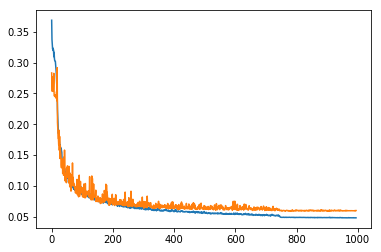

In [19]:
plt.plot(callback_list[1].history['train_loss'][5:])
plt.plot(callback_list[1].history['val_loss'][5:])

In [20]:
checkpoint = torch.load('../results/resnet/resnet-18-3c-nrmse.pth-best.tar')

## Loading the best model

In [21]:
from cpe775.utils.img_utils import show_landmarks_batch

In [22]:
net = resnet18(in_shape=(-1, 1, 256, 256), out_shape=(-1, 68, 2))

In [23]:
best_model = Model(net)
best_net = model.net
best_net.load_state_dict(checkpoint['state_dict'])

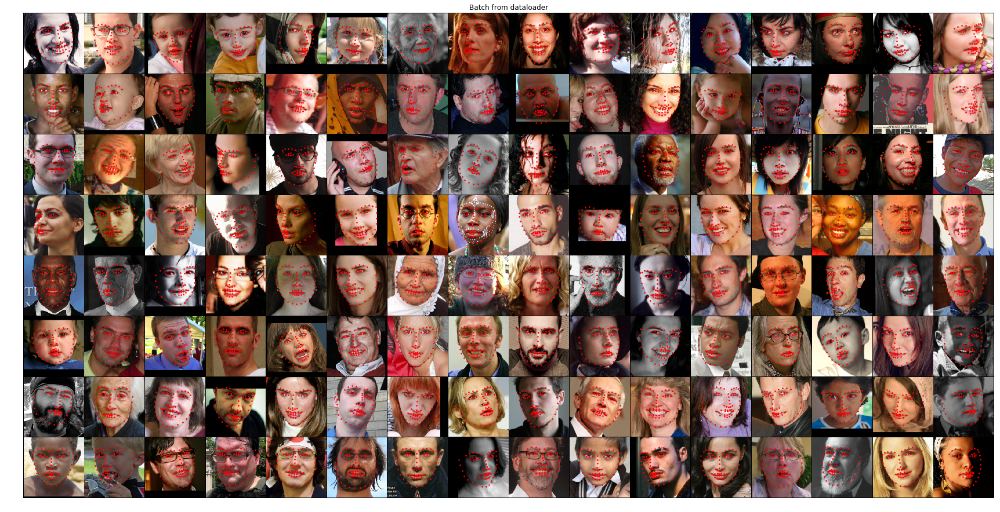

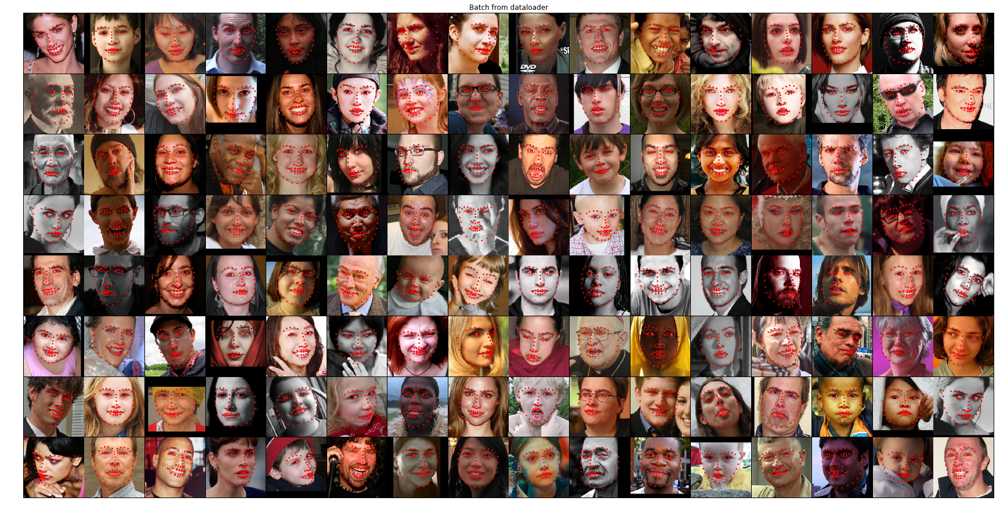

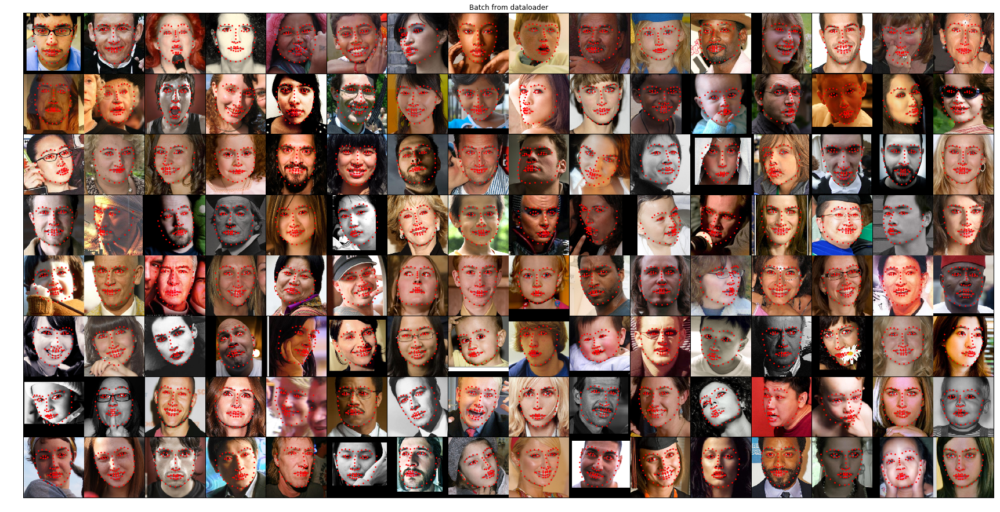

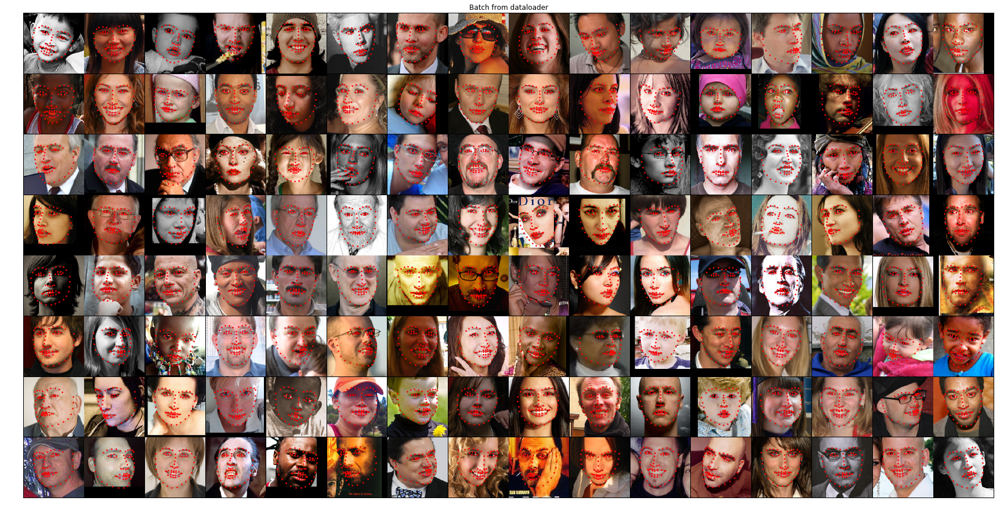

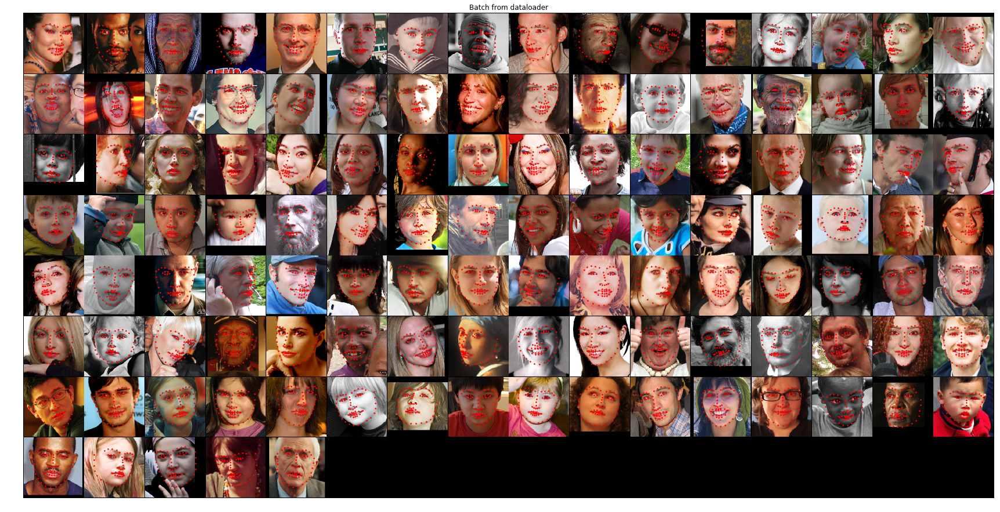

In [24]:
for i_batch, sample_batched in enumerate(valid_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data

    
    plt.figure(figsize=(30,18))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks}, nrow=16)

    plt.axis('off')
    plt.ioff()
    plt.show()

### Common test

In [25]:
transforms = Compose([
                   CropFace(),
                   CenterCrop((224,224)),
                   ToTensor()
                 ])

In [ ]:
# load the dataset
dataset = FaceLandmarksDataset(csv_file='../data/common_test.csv',
                               root_dir='../data/',
                               transform=transforms)

common_loader = torch.utils.data.DataLoader(dataset, 
                batch_size=batch_size, num_workers=4)

In [ ]:
loss = 0
for i_batch, sample_batched in enumerate(common_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(30,18))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks}, nrow=16)
    plt.axis('off')
    plt.ioff()
    plt.show()

In [ ]:
loss/len(dataset)*68

### Challenging test

In [ ]:
# load the dataset
challenging_set = FaceLandmarksDataset(csv_file='../data/challenging_test.csv',
                               root_dir='../data/',
                               transform=transforms)

challeging_loader = torch.utils.data.DataLoader(challenging_set, 
                batch_size=batch_size, num_workers=4)

In [ ]:
loss = 0
for i_batch, sample_batched in enumerate(challeging_loader):
    
    predicted_landmarks = best_net(torch.autograd.Variable(sample_batched['image'], volatile=False)).cpu().data
    
    loss += predicted_landmarks.shape[0]*criterion(predicted_landmarks, sample_batched['landmarks'])
    
    plt.figure(figsize=(30,18))
    show_landmarks_batch({'image': sample_batched['image'], 'landmarks': predicted_landmarks}, nrow=16)
    plt.axis('off')
    plt.ioff()
    plt.show()

In [ ]:
loss/len(challenging_set)*68